In [1]:
# Import packages
import pandas as pd
import pacmap
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# pandas display format: two decimals
# pd.options.display.float_format = '{:,.2f}'.format

Project aims: 
- Identify distinct modes of operation in the historical data. 
- Gain insights into process dynamics & control, particularly relating to high silica events. 

Ingest & analyse raw data

In [2]:
# Create dataframe
iof_data = pd.read_csv('iof_data.csv', index_col='date',parse_dates = ['date'])#parse dates to associated timestamps with row indices

# Rename columns to improve legibility
iof_data.columns = iof_data.columns.str.replace('date','timestamp')
iof_data.columns = iof_data.columns.str.replace('plant.','')
iof_data.columns = iof_data.columns.str.replace('flotation.','')
iof_data.columns = iof_data.columns.str.replace('filters.','')
iof_data.columns = iof_data.columns.str.replace('.','_')
iof_data.columns = iof_data.columns.str.replace('sump01_','sump_') #note: there is only one sump - "sump01" is not a useful descriptor.
iof_data.columns = iof_data.columns.str.replace('bank01_','') #note: there is only one bank - "bank01" is not a useful descriptor.
print(iof_data.columns)

Index(['feed_iron_comp', 'feed_silica_comp', 'sump_starch_flow',
       'sump_amina_flow', 'sump_discharge_flow', 'sump_discharge_ph',
       'sump_discharge_density', 'column01_air_flow', 'column02_air_flow',
       'column03_air_flow', 'column04_air_flow', 'column05_air_flow',
       'column06_air_flow', 'column07_air_flow', 'column01_pulp_level',
       'column02_pulp_level', 'column03_pulp_level', 'column04_pulp_level',
       'column05_pulp_level', 'column06_pulp_level', 'column07_pulp_level',
       'product_iron_comp', 'product_silica_comp'],
      dtype='object')


Data preprocessing

- Each preprocessing step affects subsequent steps, as well as subsequent analysis/modelling. This should be borne in mind. 

- When considering process data, it is especially important to identify periods during which the process was not operational. Considering these offline periods as identical to periods of online operation can lead to misleading results. 

In [3]:
# Downsample and drop NaN values
# Arguably the most influential data preprocessing step is upsampling - perform this first. 
iof_data = iof_data.resample('1h').mean()#change timestamp to 1 hrs an interval (as opposed to 20 mins), taking median of the time stamp.
#1 h is a suitable interval, given that the variables of interest (product composition) are sampled at hourly intervals.
iof_data.dropna(inplace=True)#remove rows with NaN; inplace indicates that dataframe after applying dropna() operation should be stored in iof_data

# By averaging over longer durations, downsampling arguably takes care of smoothing

In [4]:
# Check missing values
# missingness = iof_data.isna().sum()
# print("Missing values (absolute)\n",missingness)

missingness = iof_data.isna().sum()/len(iof_data)
print("Missing values (% of total)\n",100*missingness)
 # Given the high degree of missingness for the feed & product compositions,
 # it is likely that these featues are measured via offline laboratory sampling.

Missing values (% of total)
 feed_iron_comp            0.0
feed_silica_comp          0.0
sump_starch_flow          0.0
sump_amina_flow           0.0
sump_discharge_flow       0.0
sump_discharge_ph         0.0
sump_discharge_density    0.0
column01_air_flow         0.0
column02_air_flow         0.0
column03_air_flow         0.0
column04_air_flow         0.0
column05_air_flow         0.0
column06_air_flow         0.0
column07_air_flow         0.0
column01_pulp_level       0.0
column02_pulp_level       0.0
column03_pulp_level       0.0
column04_pulp_level       0.0
column05_pulp_level       0.0
column06_pulp_level       0.0
column07_pulp_level       0.0
product_iron_comp         0.0
product_silica_comp       0.0
dtype: float64


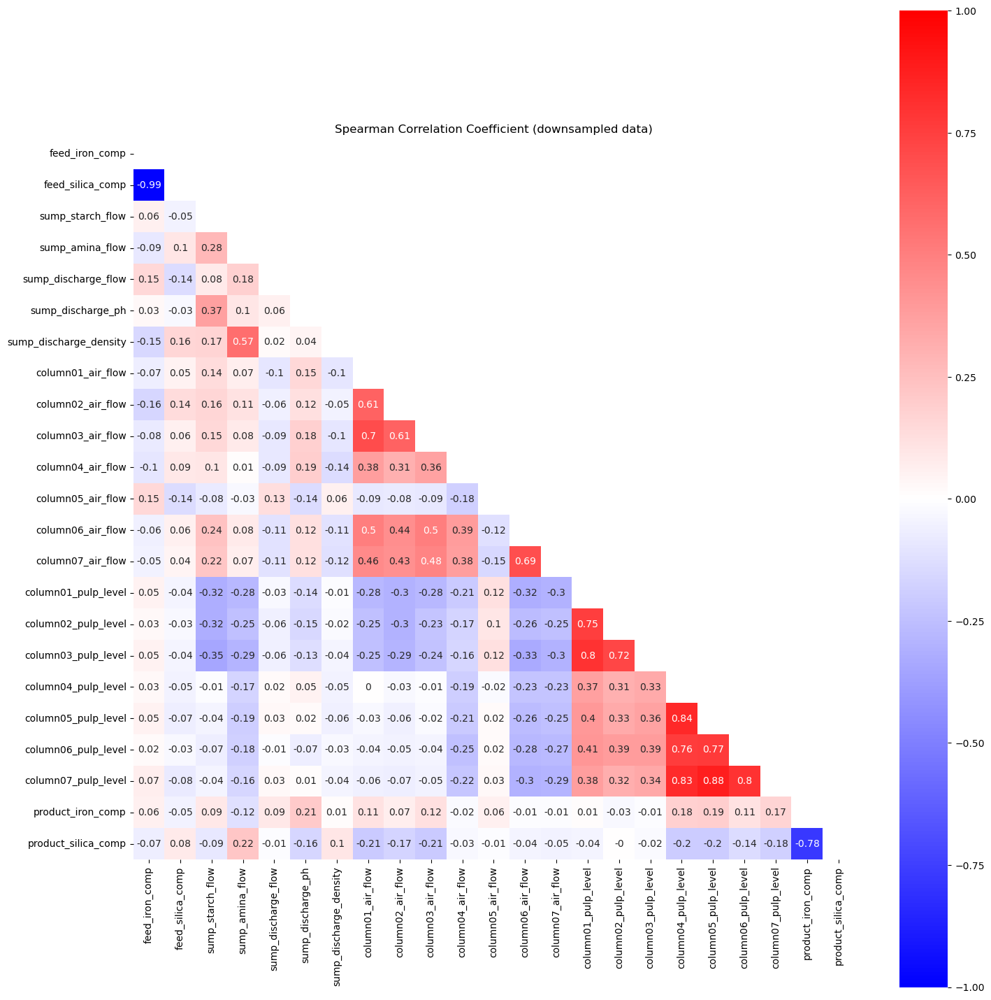

In [5]:
# Check Pearson/Spearman correlation coefficient
corr = iof_data.corr(method='spearman')
# Round numbers to 2 decimal places, to make it easier to read
corr = corr.apply(lambda x: round(x,2)) #lambda defines an anonymous function
# Generate a mask for the upper triangle (i.e. to remove upper triangle and keep view simple)
mask = np.triu(np.ones_like(corr, dtype=np.bool_))
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr,mask=mask, square=True, cmap=plt.cm.bwr,annot=True,vmin=-1,vmax=1)
plt.title('Spearman Correlation Coefficient (downsampled data)')
plt.tight_layout()

# Note: If a set of variables has a small Pearson correlation coefficient, 
# this doesn't mean that there is no relationship between them. It simply means that there is no linear relationship.

# Note also: "product" stream refers to the tailings! 

# Silica and iron exhibit strong negative correlation coefficients, both in the feed & product. 
# To conserve mass, a percentage increase in one must correspond to a percentage decrease in the other.

# Amina flow (amines, which are cationic collectors) evidently corresponds to an increase in density.
# Amina collects silica to the concentrate, such that the sump discharge contains more iron, which is denser. 
# (i.e., the silica in the discharge is displaced in favour of the iron)

# Air flow rates (manipulated variables) tend to be strongly correlated. 
# This may suggest that they are responding to the same disturbances, and/or that they are controlled together. 

# Correlation analysis with Pearson & Spearman correlation coefficients both indicate that there is no linear or nonlinear correlation between inlet and outlet composition.
# In all likelihood, a stronger correlation may become evident if the outlet data are lagged appropriately. Moreover, looking for relationships between variables arguably
# requires more than just looking at correlation coefficients - a single variable may well be insufficient for characterising the relationship between two features!

In [6]:
#Provide descriptive statistics
D = iof_data.describe().T #descriptive statistics for each row. Note that the .T transposes the output
D.style.format({"count":'{:.0f}', "mean": '{:.1f}', "std": '{:.1f}',"min": '{:.1f}',"25%": '{:.1f}',"50%": '{:.1f}',"75%": '{:.1f}',"max": '{:.1f}'})

,count,mean,std,min,25%,50%,75%,max
feed_iron_comp,4032,56.3,5.2,42.7,52.6,56.0,59.7,65.8
feed_silica_comp,4032,14.7,6.9,1.3,8.9,13.9,20.0,33.4
sump_starch_flow,4032,2871.9,946.0,54.6,2175.8,2909.1,3529.3,6270.2
sump_amina_flow,4032,488.4,83.4,242.9,436.3,502.5,549.6,737.0
sump_discharge_flow,4032,397.5,8.4,376.8,398.8,399.8,400.6,418.1
sump_discharge_ph,4032,9.8,0.4,8.8,9.5,9.8,10.0,10.8
sump_discharge_density,4032,1.7,0.1,1.5,1.7,1.7,1.7,1.8
column01_air_flow,4032,280.8,29.0,175.9,250.1,299.8,300.0,312.3
column02_air_flow,4032,277.8,29.0,178.2,250.1,299.6,300.0,309.9
column03_air_flow,4032,281.8,27.9,177.2,250.1,299.9,299.9,302.8


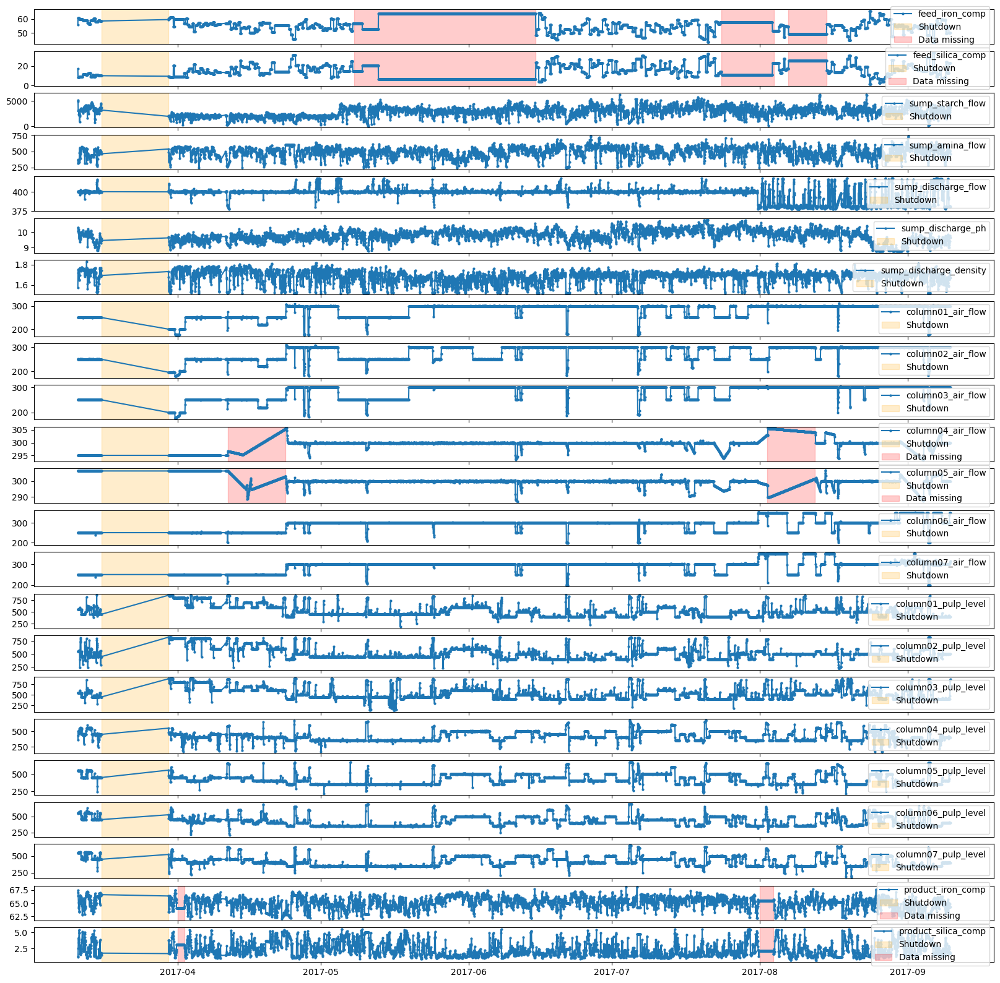

In [7]:
# Visualise time series data
fig,ax  = plt.subplots(iof_data.shape[1],1,sharex = True,figsize = (20,20))
# fig,ax  = plt.subplots(2,1,sharex = False,figsize = (10,10))
# Define desired shaded regions
start1 = "2017-03-16 00:00:00"
end1 = "2017-03-30 00:00:00"

start2 = "2017-05-08 00:00:00"
end2 = "2017-06-15 00:00:00"

start3 = "2017-07-24 00:00:00"
end3 = "2017-08-04 00:00:00"

start4 = "2017-08-07 00:00:00"
end4 = "2017-08-15 00:00:00"

start5 = "2017-04-11 12:00:00"
end5 = "2017-04-23 12:00:00"

start6 = "2017-08-02 12:00:00"
end6 = "2017-08-12 12:00:00"

start7 = "2017-04-01 00:00:00"
end7 = "2017-04-02 10:00:00"

start8 = "2017-08-01 00:00:00"
end8 = "2017-08-03 21:00:00"

for idx in range(iof_data.shape[1]):
    ax[idx].plot(iof_data.index,iof_data.iloc[:,idx],label = iof_data.columns[idx],marker = 'o',markersize=2)
    
    ax[idx].axvspan(pd.to_datetime(start1),pd.to_datetime(end1),color = 'orange',alpha = 0.2,label = "Shutdown")
    
    if (idx == 0) or (idx == 1):   
        ax[idx].axvspan(pd.to_datetime(start2),pd.to_datetime(end2),color = 'red',alpha = 0.2,label = "Data missing")
        ax[idx].axvspan(pd.to_datetime(start3),pd.to_datetime(end3),color = 'red',alpha = 0.2)
        ax[idx].axvspan(pd.to_datetime(start4),pd.to_datetime(end4),color = 'red',alpha = 0.2)

    if (iof_data.columns[idx] == "column04_air_flow") or (iof_data.columns[idx] == "column05_air_flow"):
       ax[idx].axvspan(pd.to_datetime(start5),pd.to_datetime(end5),color = 'red',alpha = 0.2,label = "Data missing")
       ax[idx].axvspan(pd.to_datetime(start6),pd.to_datetime(end6),color = 'red',alpha = 0.2)
    
    if (iof_data.columns[idx] == "product_silica_comp") or (iof_data.columns[idx] == "product_iron_comp"):
        ax[idx].axvspan(pd.to_datetime(start7),pd.to_datetime(end7),color = 'red',alpha = 0.2,label = "Data missing")
        ax[idx].axvspan(pd.to_datetime(start8),pd.to_datetime(end8),color = 'red',alpha = 0.2)

    ax[idx].legend(loc = "right") 

# Missing & faulty data
# Can already see that there was a shutdown in March 2017, for which no data were recorded.
# Furthermore, the feed composition is offline for long periods, as evidenced by the lack of change over time. 
# Gaps in the air flowrate data is evidenced by a gradual increase in datapoints over a period of months/days.

# Process operation & dynamics
# Evidently, the air flow rates are mostly confined to distinct set-points. These are likely controlled manually. 

#The sump discharge flow rate drops significantly in August 2017, and its variance also increases significantly from this time onwards.

In [8]:
# Remove long periods of interpolated data ("faulty data")
# Offline = TNPE_model["Extract feed to E4903 (m³/h)"] < 2 #don't really want to include startup dynamics. 
# TNPE_model = TNPE_model[~Offline]
faulty_data = iof_data.loc[  ((iof_data.index >= start2) & (iof_data.index <= end2)) | ((iof_data.index >= start3) & (iof_data.index <= end3)) 
                           | ((iof_data.index >= start4) & (iof_data.index <= end4)) |
                           ((iof_data.index >= start5) & (iof_data.index <= end5)) | ((iof_data.index >= start6) & (iof_data.index <= end6)) | ((iof_data.index >= start7) & (iof_data.index <= end7)) |
                           ((iof_data.index >= start8) & (iof_data.index <= end8))]

iof_data = iof_data.drop(index = faulty_data.index)

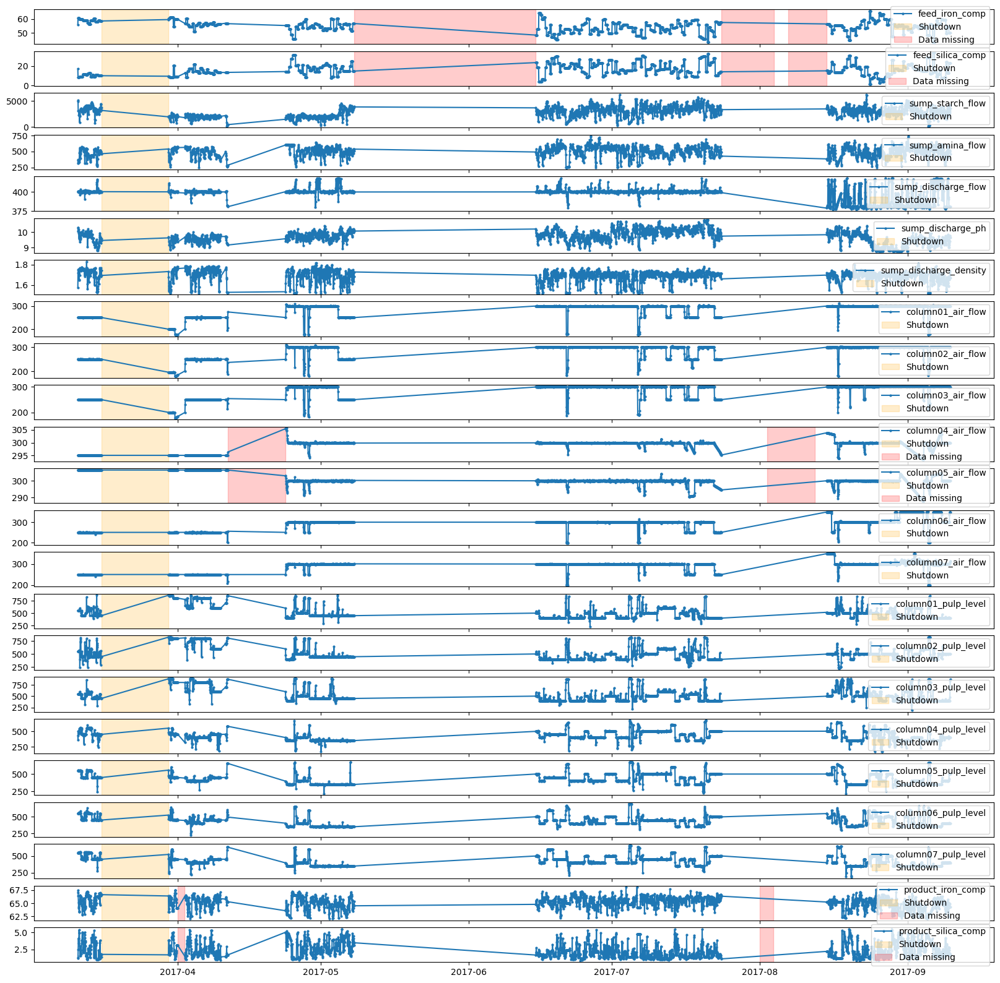

In [9]:
fig,ax  = plt.subplots(iof_data.shape[1],1,sharex = True,figsize = (20,20))

for idx in range(iof_data.shape[1]):
    ax[idx].plot(iof_data.index,iof_data.iloc[:,idx],label = iof_data.columns[idx],marker = 'o',markersize=2)
    
    ax[idx].axvspan(pd.to_datetime(start1),pd.to_datetime(end1),color = 'orange',alpha = 0.2,label = "Shutdown")
    
    if (idx == 0) or (idx == 1):   
        ax[idx].axvspan(pd.to_datetime(start2),pd.to_datetime(end2),color = 'red',alpha = 0.2,label = "Data missing")
        ax[idx].axvspan(pd.to_datetime(start3),pd.to_datetime(end3),color = 'red',alpha = 0.2)
        ax[idx].axvspan(pd.to_datetime(start4),pd.to_datetime(end4),color = 'red',alpha = 0.2)

    if (iof_data.columns[idx] == "column04_air_flow") or (iof_data.columns[idx] == "column05_air_flow"):
       ax[idx].axvspan(pd.to_datetime(start5),pd.to_datetime(end5),color = 'red',alpha = 0.2,label = "Data missing")
       ax[idx].axvspan(pd.to_datetime(start6),pd.to_datetime(end6),color = 'red',alpha = 0.2)
    
    if (iof_data.columns[idx] == "product_silica_comp") or (iof_data.columns[idx] == "product_iron_comp"):
        ax[idx].axvspan(pd.to_datetime(start7),pd.to_datetime(end7),color = 'red',alpha = 0.2,label = "Data missing")
        ax[idx].axvspan(pd.to_datetime(start8),pd.to_datetime(end8),color = 'red',alpha = 0.2)

    ax[idx].legend(loc = "right") 

In [10]:
# Smoothing - arguably implicitly performed via downsampling.
# Identification & removal of outliers requires consultation with plant personnel. 
# Statistical outlier removal risks the removal of meaningful outliers (e.g., plant disturbances). 
# How to treat outliers depends on the aim of the data analysis/modelling task. 
# We want to gain insights into the process. Therefore, it may be best to retain outliers, 
# as they may be linked to meaningful process disturbances.

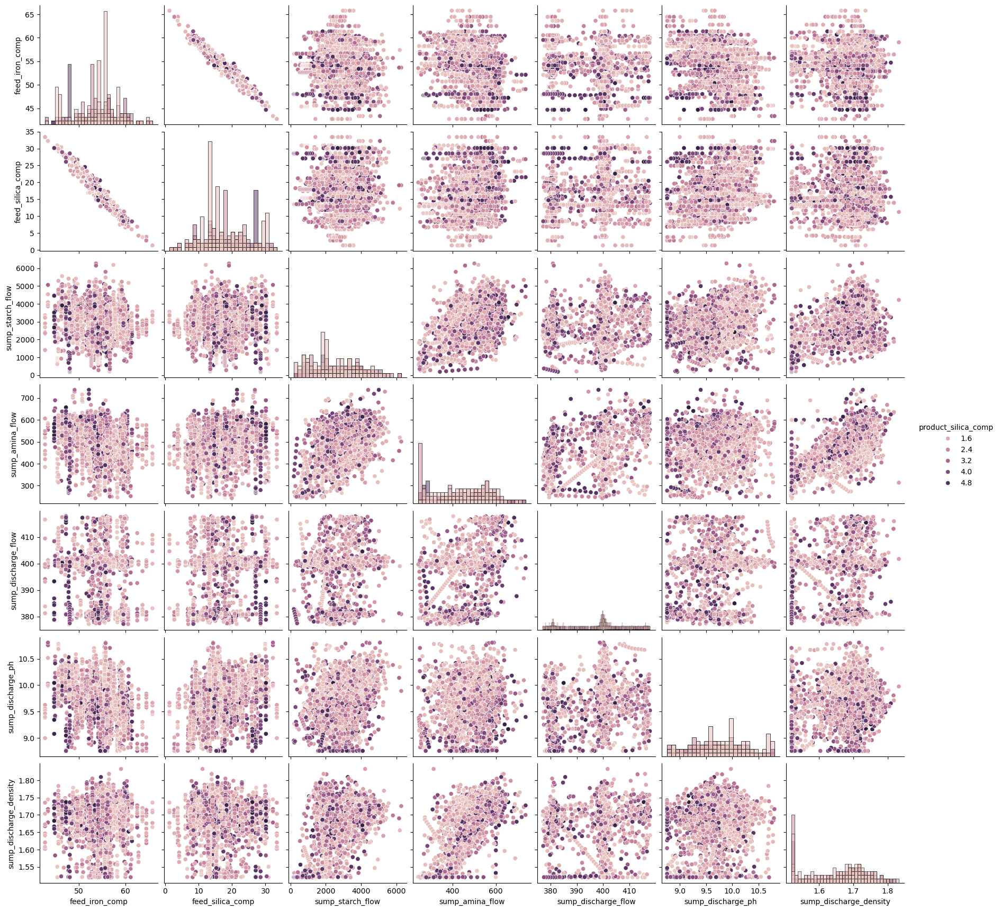

In [11]:
# View data as bivariate scatter plots
# Best to view data after removal of "faulty" data - this ensures that the analysed plots are not misleading. 
# Consider subsets of the variables for ease of viewing
sns.pairplot(iof_data[['feed_iron_comp','feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
                       'product_silica_comp']], hue = "product_silica_comp",diag_kind = 'hist') # diag_kind = 'none' may speed up computations. 

# Higher product silica composition values correspond to higher feed silica compositions - see dark spikes in feed silica composition histogram - but not always! 

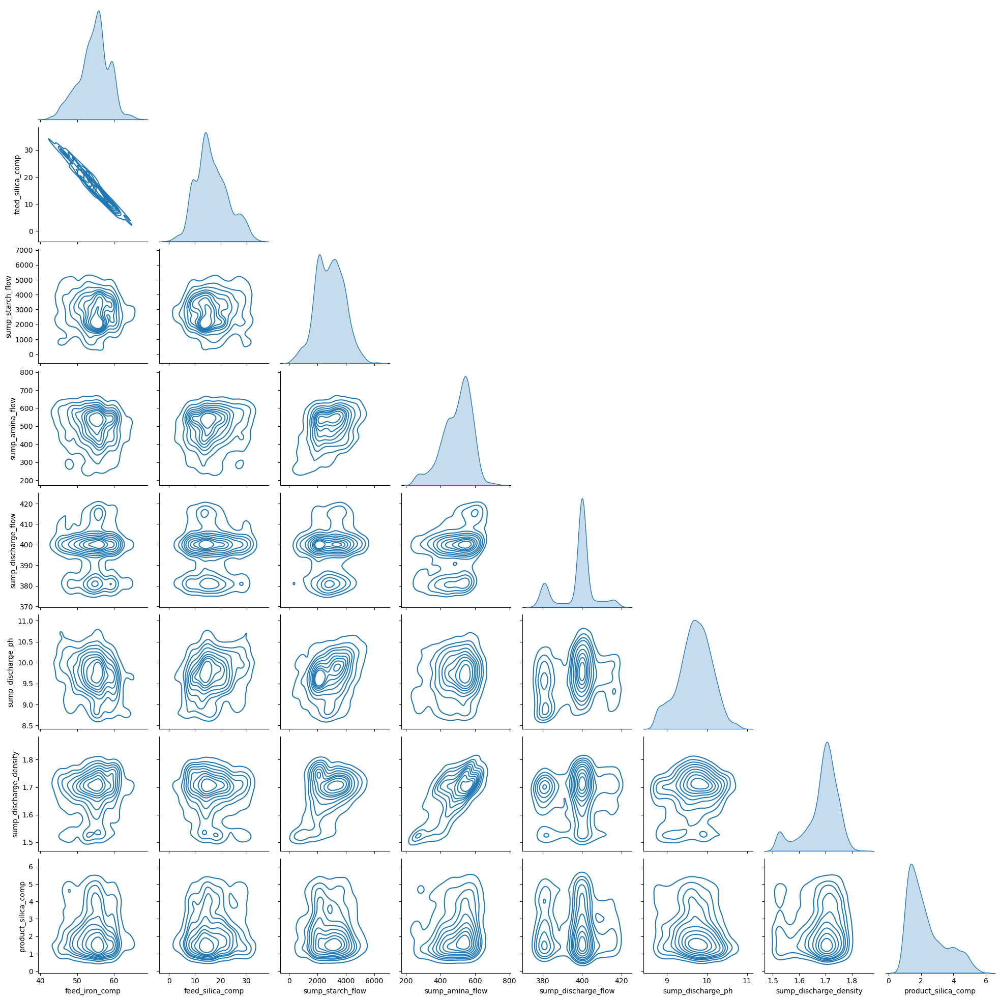

In [12]:
# View data as bivariate scatter plots
# Consider subsets of the variables for ease of viewing
sns.pairplot(iof_data[['feed_iron_comp','feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
                       'product_silica_comp']],kind='kde',corner = True) #best way to view this is via the browser.

# Kernel density estimate (KDE) plots are a very useful tool for visualizing large (i.t.o. many datapoinst) datasets. 
# KDEs are composite functions constructed from kernels (usually Gaussian) centred on the individual datapoints. 
# They are probability density functions of the underlying data. 
# Probability density (datapoint density) is represented as contour lines. 

# When there are many datapoints, the distribution of the data can be unclear. KDEs reveal regions of greater point density,
# which are visible as regions of closely packed contour lines. 

# Note that Generating KDE plots can be computationally expensive.

# Initial observations
# Sump discharge flow rate exhibits a trimodal univariate KDE plot (see the 5th diagonal element).
# This suggests three "modes" of operation: low flow, normal flow (which predominates) and high flow. 
# This "trimodality" can be more readily visualised using KDE plots than scatter plots, underlining the utility of these plots.
# Looking at the biplot for silica composition & discharge flow rate indicates that the silica composition does not seem to be significantly
# affected between these three flow rate "modes"

# The KDE plot shows that starch & amina flow are both positively correlated to discharge density.
# However, starch & amina flows show no correlation to product silica content.

# The sump discharge density also exhibits a bimodal nature, suggesting that there is a "low density" process mode/disturbance
# Significantly, the KDE plot shows a distinct grouping of low discharge densities corresponding to high silica content. 
# Additionally, low discharge density can also correspond to low silica content  - there is another distinct grouping for 
# low discharge density & low silica content. This suggests two "modes" of operation in the dataset.

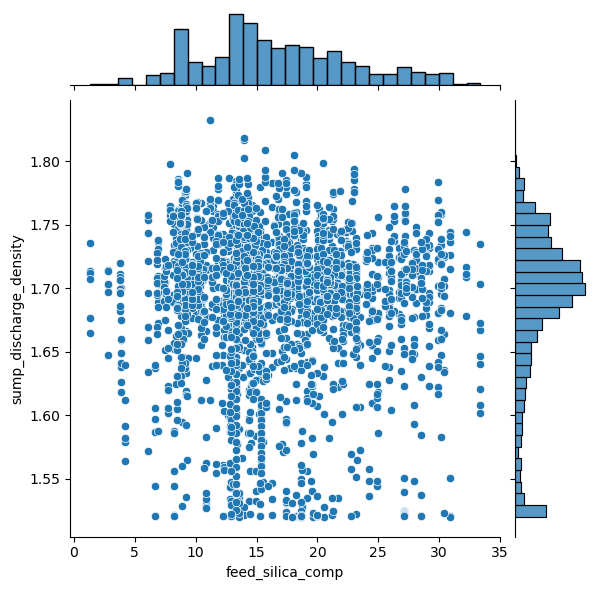

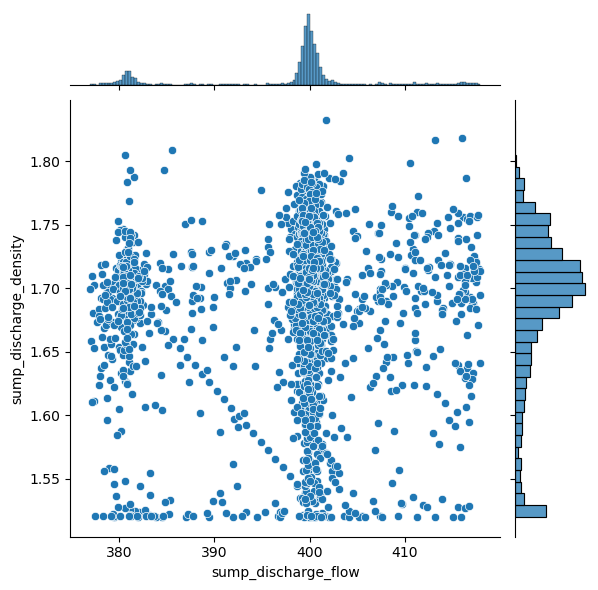

In [13]:
# Distinct mode exhibiting low discharge density: corresponds to low amina & starch flow, and in part to reduced discharge flow.
# How does the discharge density relate to feed silica content? Is there a relation? A joint plot of density & feed silica (see below) indicates that low discharge densities are
# associated with a range of feed silica content values, so we can't conclude that there is any meaningful relationship. 

#Nonetheless, there certainly does appear to be a subset of datapoints which exhibit low discharge density as well as low discharge flows, though there are data with low density & high flows.
# It would be interesting to discuss the causes & significance of this data grouping with process personnel.

sns.jointplot(x=iof_data["feed_silica_comp"],y = iof_data["sump_discharge_density"])

sns.jointplot(x=iof_data["sump_discharge_flow"],y = iof_data["sump_discharge_density"])

#Note the straight line of data points in the second joint plot - such straight lines do not arise in noisy processes. 
# This points to the presence of observations which feature both missing density & flow rate data, and for which these data were imputed.

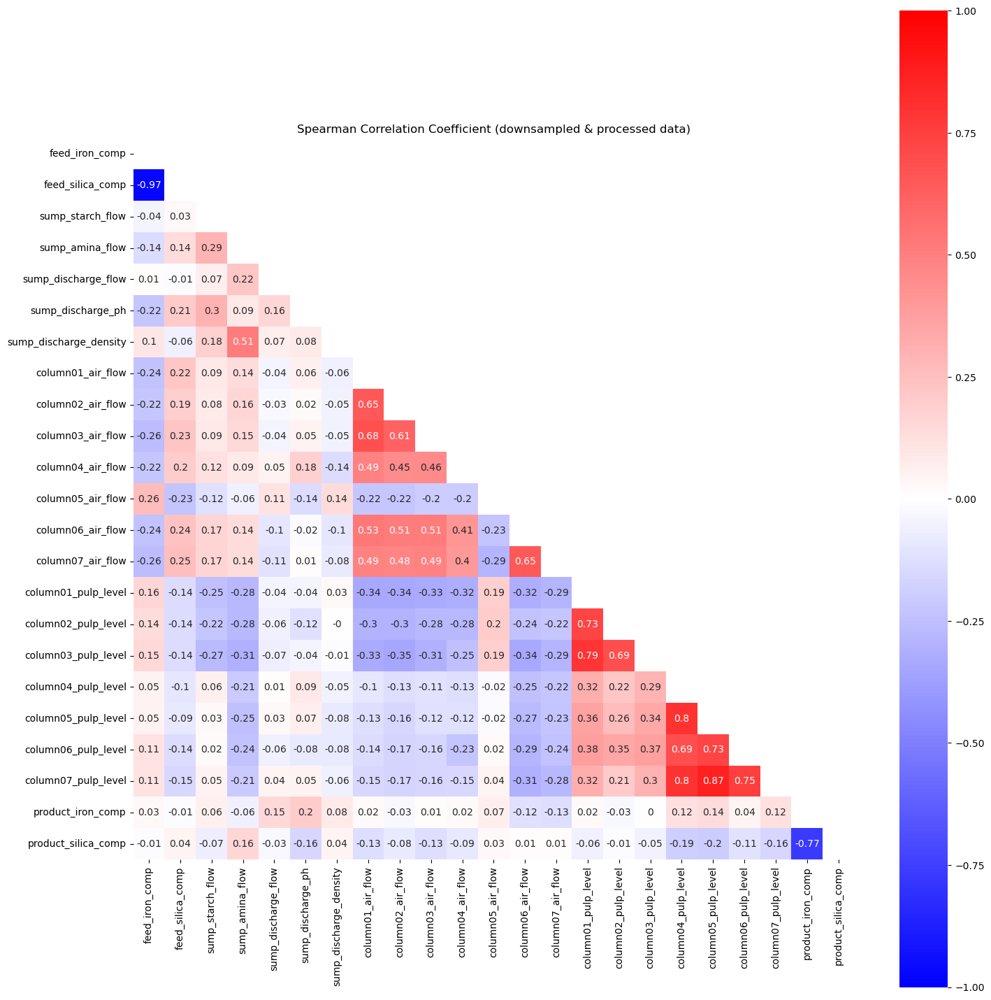

In [14]:
# Check Pearson/Spearman correlation coefficient after removing "faulty" data

corr = iof_data.corr(method='spearman')
# Round numbers to 2 decimal places, to make it easier to read
corr = corr.apply(lambda x: round(x,2)) #lambda defines an anonymous function
# Generate a mask for the upper triangle (i.e. to remove upper triangle and keep view simple)
mask = np.triu(np.ones_like(corr, dtype=np.bool_))
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr,mask=mask, square=True, cmap=plt.cm.bwr,annot=True,vmin=-1,vmax=1
)
plt.title('Spearman Correlation Coefficient (downsampled & processed data)')
plt.tight_layout()


# This seems to resemble the previous correlation matrix.


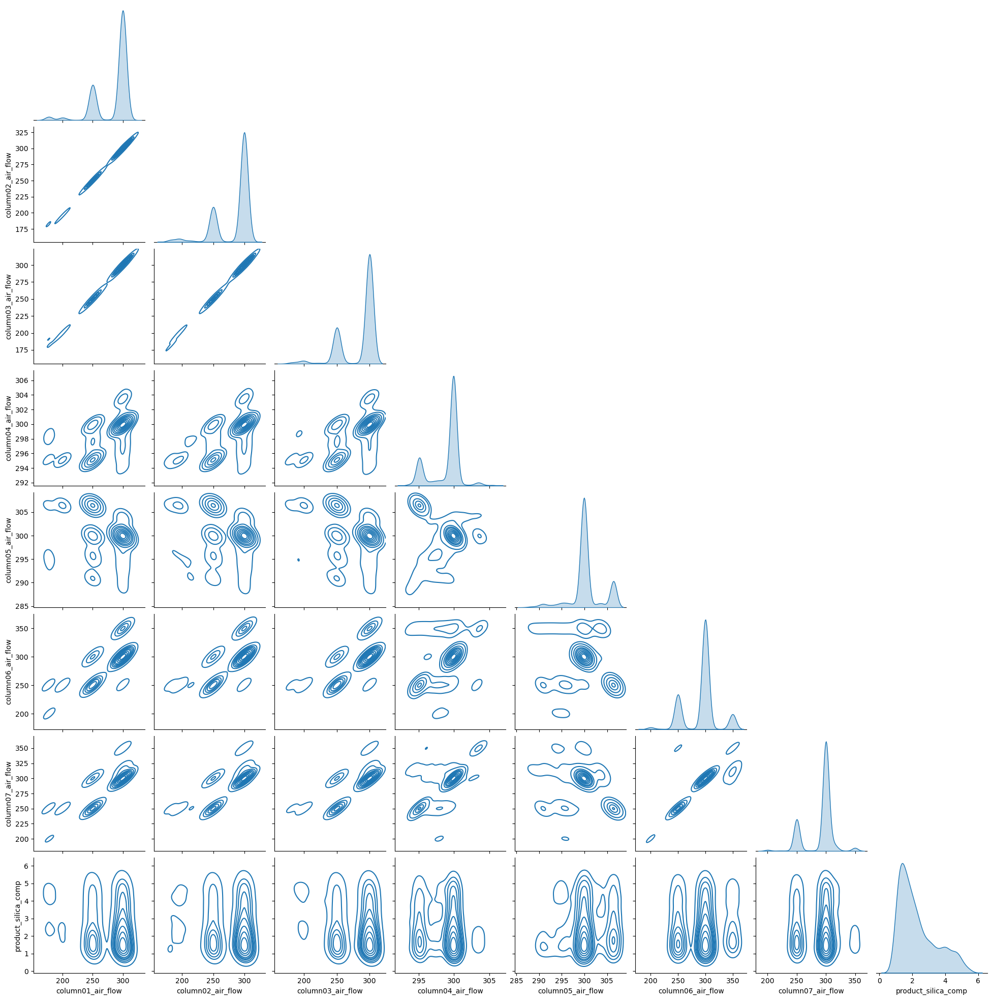

In [15]:
sns.pairplot(iof_data[['column01_air_flow','column02_air_flow','column03_air_flow','column04_air_flow','column05_air_flow','column06_air_flow','column07_air_flow',
                       'product_silica_comp']],kind='kde',corner = True) #best way to view this is via the browser.

# Column 1,2 & 3 air flow rates are clearly positively correlated.
# The same holds fo the air flow rates of columns 6 & 7.
# It becomes clear that the air flow rates assume distinct modes of operation
# A given air flow rate's mode is confined to discrete, non-overlapping ranges.

# However, none of the air flow rates appear to be correlated with product silica content.
# Distinct outlying clusters can be seen. These may correspond to operator/control system reactions to process disturbances.

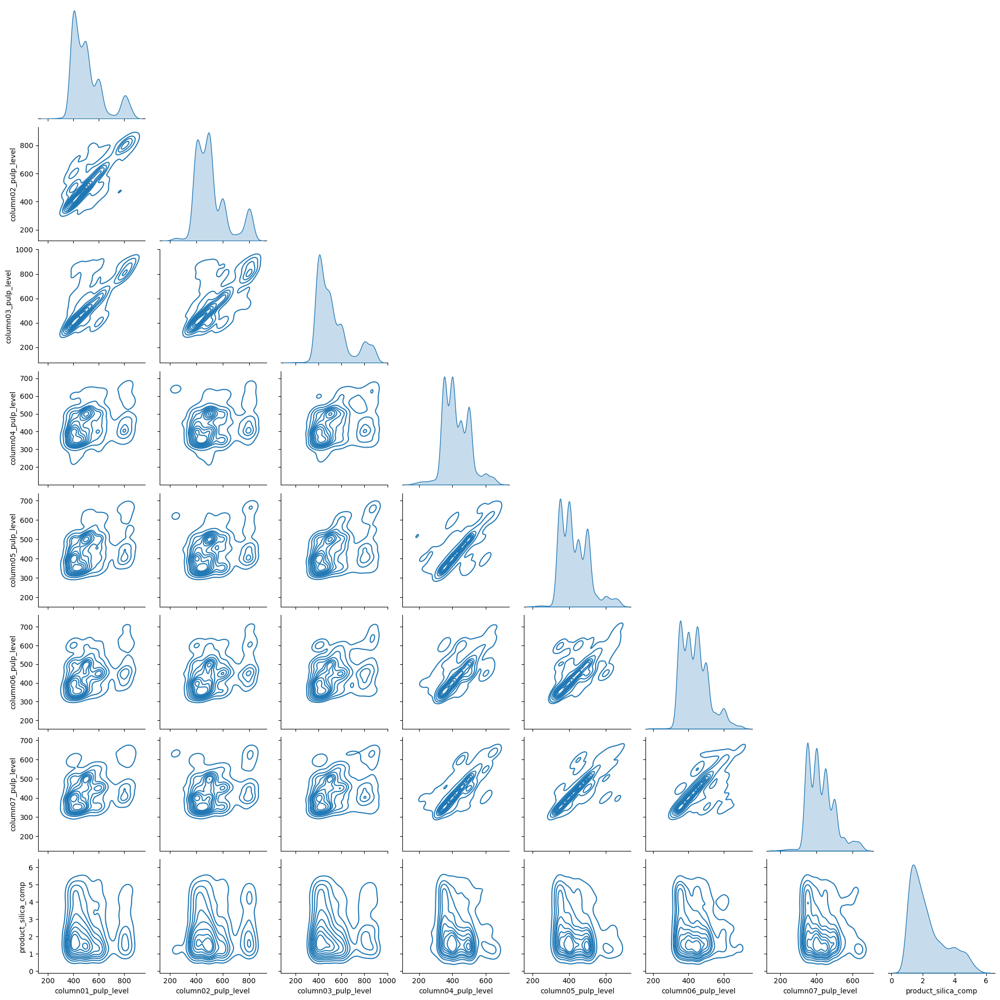

In [16]:
sns.pairplot(iof_data[['column01_pulp_level','column02_pulp_level','column03_pulp_level','column04_pulp_level','column05_pulp_level','column06_pulp_level','column07_pulp_level',
                       'product_silica_comp']],kind='kde',corner = True) #best way to view this is via the browser.

# Column 1, 2 & 3 exhibit strong positivie correlations in the pulp levels. The same holds for columns 4,5,6 & 7 
# The pulp levels occupy much less distinct ranges than the air flowrates. 
# As for the air flow rates, no strong correlation to the product silica composition in evidence. 

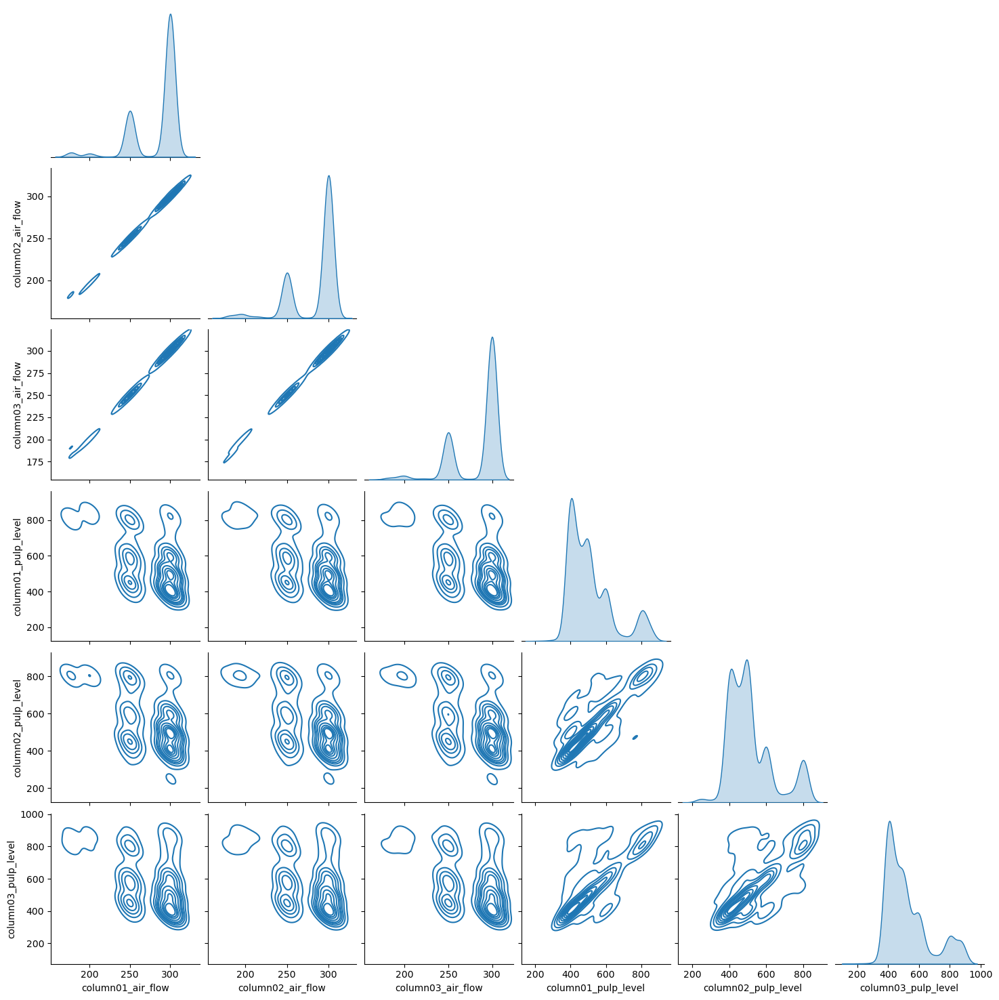

In [17]:
sns.pairplot(iof_data[['column01_air_flow','column02_air_flow','column03_air_flow','column01_pulp_level','column02_pulp_level','column03_pulp_level']],kind='kde',corner = True) #best way to view this is via the browser.

# Evidently, each distinct air flow rate "range" corresponds to multiple pulp levels.
# No correlation between air flow rates & pulp levels.

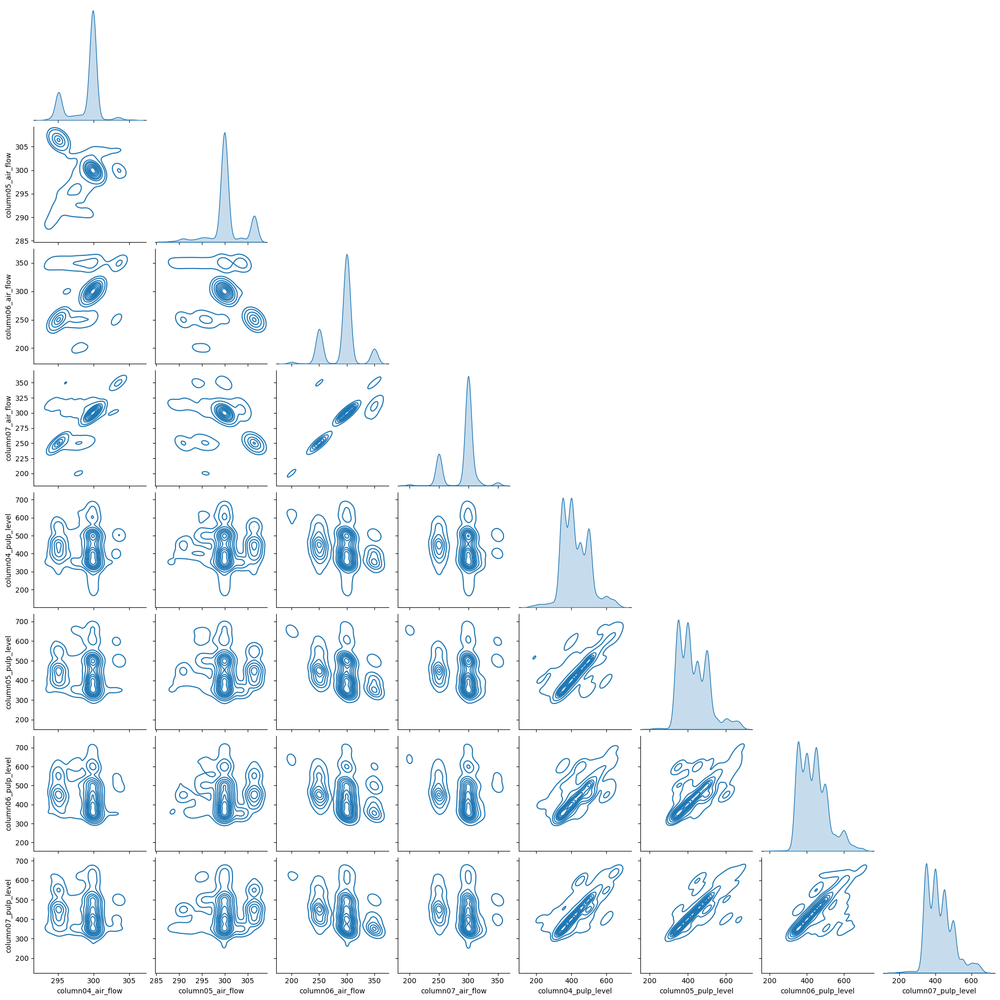

In [18]:
sns.pairplot(iof_data[['column04_air_flow','column05_air_flow','column06_air_flow','column07_air_flow',
                       'column04_pulp_level','column05_pulp_level','column06_pulp_level','column07_pulp_level']],kind='kde',corner = True) #best way to view this is via the browser.

# Evidently, each distinct air flow rate "range" corresponds to multiple pulp levels.
# No correlation between air flow rates & pulp levels.

Fit a random forest to the data to find the variables most strongly associated with product silica content

In [19]:
import sklearn.metrics as metrics
from sklearn.ensemble import RandomForestRegressor
# from sklearn.model_selection import cross_val_score,TimeSeriesSplit, RandomizedSearchCV

Y = iof_data["product_silica_comp"].to_numpy()
feature_names = iof_data.columns.drop(['product_iron_comp','product_silica_comp']) #also drop the product iron composition - it's a complementary measurement of the silica composition.
iof_data = iof_data[feature_names]
X = iof_data[feature_names].to_numpy()#no scaling required for random forests

RF_model = RandomForestRegressor(random_state=124,oob_score = False, bootstrap=True,criterion = "squared_error") #use default hyperparameters. 100 trees in the forest.
RF_model.fit(X,Y)

# my_TSCV = TimeSeriesSplit(n_splits=5)#split data such that, for a given fold, training data has lower index (i.e., occurs before) test data

Y_RF = pd.DataFrame(RF_model.predict(X),index = iof_data.index)

Y_RF_MAPE = metrics.mean_absolute_percentage_error(Y,Y_RF)*100
print("Random forest MAPE: %.2f" % Y_RF_MAPE,"%")

Y_RF_MAE = metrics.mean_absolute_error(Y,Y_RF)
print("Random forest MAE: %.2f" % Y_RF_MAE)

Random forest MAPE: 13.13 %
Random forest MAE: 0.26


Determine feature importances (based on each feature's mean decrease in impurity across all trees)

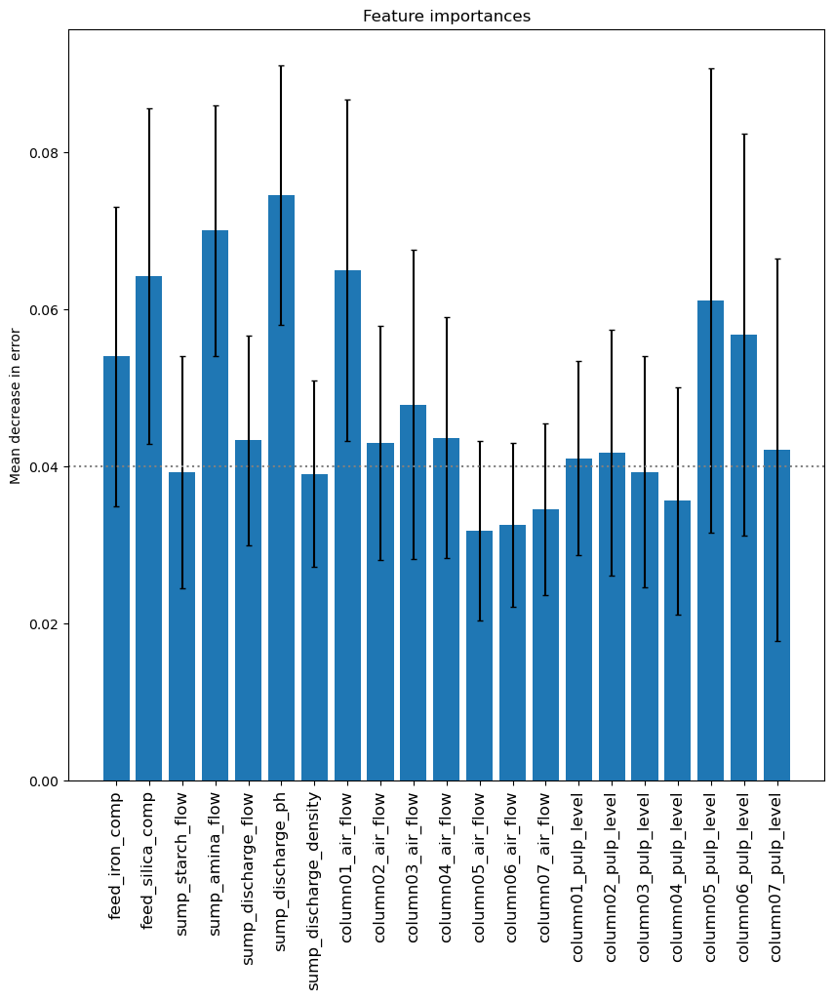

In [ ]:
FI = RF_model.feature_importances_ 
FI_std_dev = np.std([tree.feature_importances_ for tree in RF_model.estimators_],axis=0)#extract feature importances for each tree
# From sklearn: feature importances are computed as the mean and standard deviation 
# of accumulation of the impurity decrease within each tree.
# A cautionary note from sklearn: impurity-based feature importances can be misleading for high cardinality features (many unique values)

fig, ax = plt.subplots(figsize = (10,10))
ax.bar(iof_data.columns,FI,yerr = FI_std_dev,capsize = 2)
plt.xticks(rotation=90,fontsize=12)
# ax.errorbar(iof_data.columns,FI,yerr = FI_std_dev,)
ax.set_title("Feature importances")
ax.set_ylabel("Mean decrease in error")
ax.axhline(0.04,color = 'gray',linestyle = 'dotted')
# Feed iron & silica content have among the largest effects on product silica. 
# Naturally, the feature importance of both variables reflect the same relationship between feed & product composition.
# Sump amina flow & discharge ph do too. These variables have not been found to be strongly correlated to one another. 

# The air flows & pulp levels tend to have weaker effects on product silica content. 
# However, the air flow rates of columns 1 & 3 seem to have higher effects, as does the pulp level in column 5
# (and to a lesser extent columns 6 & 7). 

# Further knowledge regarding plant operation may explain these observations. 
# This would be something worth discussing with plant personnel.

# I suspect that the criterion used for determining feature importance is the squared error.
# I could also make use of permutation importance to validate these feature importance results, 
# or use SHAP analysis to understand the relation between the model features & product silica content.

In [21]:
# explainer = shap.TreeExplainer(rf)
# shap_values = explainer.shap_values(X_test)

Key conclusions to date:

Conclusions are best drawn by synthesising results of visual data analysis, cross-correlation matrices and the random forest feature importance measures.

Determining features for product silica composition
- Based on the correlation matrix, column 4 & 5 pulp level as well as column 7 pulp level (and column 6 pulp level) are modestly correlated with product silica composition. The same holds for the air flow of columns 1 - 4, and for amina flow & sump discharge ph. "Modest" in this context means a correlation coefficient between _ca_ 0.1 and 0.2. 

- Sump discharge pH and amina flow also have high feature importances, as do pulp levels 5, 6 and 7 and column 1 air flow. This suggests that these are the most important features. 
- Additionally, feature importance measures suggest that feed composition has a moderate effect on product composition (this would be expected!), though the correlation matrix suggests no effect. 
This is borne out by histogram-based data analysis, which suggests that some elevated feed silica compositions correspond to high product silica compositions. 


Process modes
- Sump discharge flow rate exhibits three modes: low flow, normal flow (predominates) and high flow. 
- Sump discharge density exhibits a bimodal nature, suggesting low density & high density modes.
- The low discharge density mode also features low sump discharge flows, as well as low amina & starch flows. 
- Air flow rates also tend to be confined to discrete, non-overlapping ranges. The same holds for pulp levels, but to a lesser extent. 
I suspect these ranges are governed by manual operator interventions.

- Significantly, the KDE plot shows a distinct grouping of low discharge densities corresponding to high silica content. 
-  Additionally, low discharge density can also correspond to low silica content  - there is another distinct grouping for 
 low discharge density & low silica content. This suggests two (potentially abnormal) "modes" of operation in the dataset.

Note that exploratory data analysis is an iterative process! 

Further investigation of the data by means of dimensionality reduction - this provides a two-dimensional view of the data, which may provide further insights.
Subsequently, outputs of dimensionality reduction are clustered, and a classifier is trained to identify these clusters. SHAP analysis is performed to determine which features are key in determining cluster (i.e., process mode) membership.

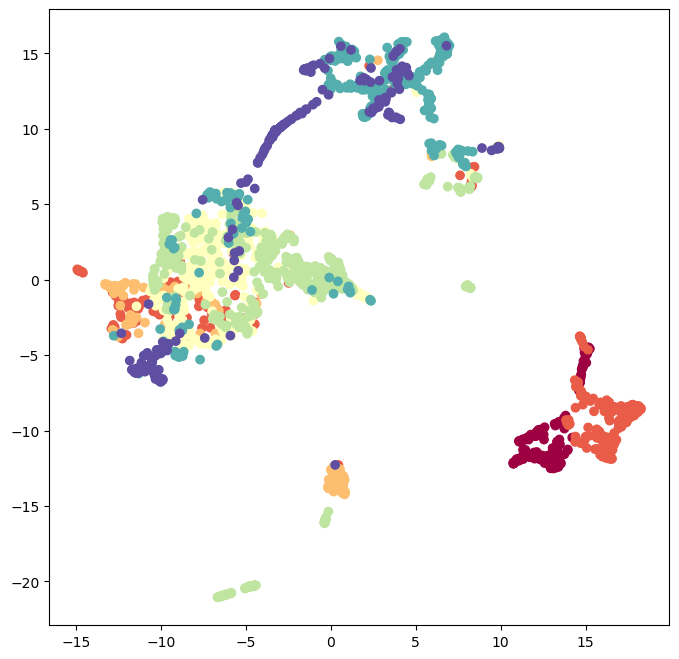

In [ ]:
# Create a low-dimensional representation of high-dimensional data (excluding the product composition) using PaCMAP
# PacMAP is a nonlinear (manifold learning) dimensionality reduction technique capable of balancing the preservation of
#  both local (i.e. neighbourhood) and global (dataset-wide) features.
# In my epxerience, PaCMAP is robust to random initialisations, which is a necessary condition for successful industrial application. 
# Other techniques (e.g., t-SNE) may show very different embeddings each time they are run, such that the results 
# a) may be an artefact of the technique and b) may well be significantly different if the technique is accidentally re-run.

import pacmap
from sklearn.preprocessing import StandardScaler

# NOTE: remove highly correlated features to prevent them from having too large an effect on the embedding (to the detriment of other features)
# NOTE also: the modes identified by PaCMAP will certainly not map completely onto the ones discovered by qualitative data analysis. 
# Those modes were identified qualitatively, and consider only individual features/subsets of the total number of features.
iof_data_reduced = iof_data[['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level']]

# Alt: reduced features
# iof_data_reduced = iof_data[['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density']]

# iof_data_reduced = iof_data[['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
#           'column01_air_flow','column05_pulp_level']]

#Run PaCMAP in a separate cell
X_PaCMAP = iof_data_reduced.to_numpy()
#scale the data prior to applying PaCMAP
X_PaCMAP = StandardScaler().fit_transform(X_PaCMAP)

# initializing the pacmap instance
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=10, MN_ratio=0.5, FP_ratio=2) #set hyperparameters such that data naturally falls into groupings in the latent space, such that they are amenable to clustering.
# However, this clustering should be meaningful! 
# embedding = umap.UMAP(random_state=3,n_neighbors = 20, min_dist = 0.1)

# fit the data (The index of transformed data corresponds to the index of the original data)
# X_transformed = embedding.fit_transform(X)#init="pca"
X_transformed = embedding.fit_transform(X_PaCMAP,init="pca")
# visualize the embedding
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(X_transformed[:, 0], X_transformed[:, 1], cmap="Spectral", c=iof_data_reduced.index.month)

Text(0.5, 0.98, 'PaCMAP')

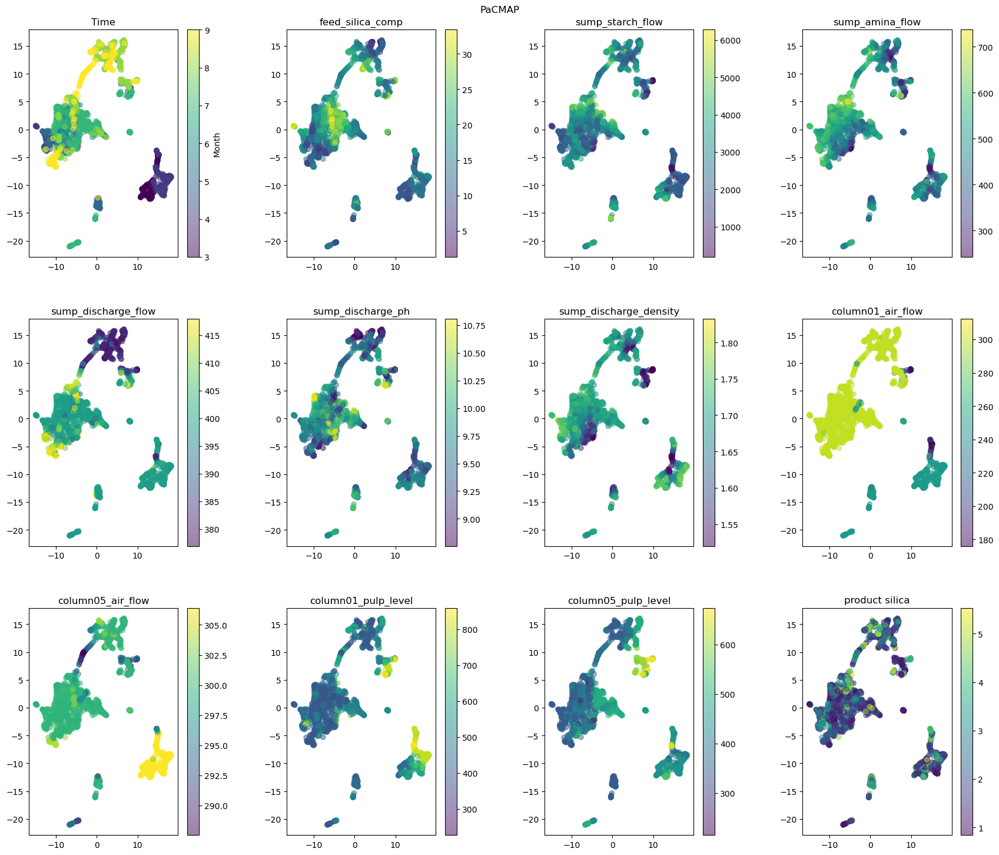

In [187]:
#visualize relation between standardized inputs & outputs by colouring latent space according to relevant variables
fig, ax = plt.subplots(4,4, figsize = (18,20))
for i in range(4):
    for j in range(4):
        k = 4*i+j -1
        if k == -1: #colour according to time
            s_plot = ax[i,j].scatter(X_transformed[:, 0], X_transformed[:, 1], c=iof_data_reduced.index.month, cmap='viridis', alpha = 0.5)
            ax[i,j].set_title('Time')
            cbar = plt.colorbar(s_plot)
            cbar.set_label('Month')
            
        elif k < iof_data_reduced.shape[1]: #colour according to features used to generate the embedding
            s_plot = ax[i,j].scatter(X_transformed[:, 0], X_transformed[:, 1], c=iof_data_reduced.iloc[:,k], cmap='viridis', alpha = 0.5)
            ax[i,j].set_title(iof_data_reduced.columns[k])
            cbar = plt.colorbar(s_plot)

        elif k == iof_data_reduced.shape[1]: #colour according to product silica composition
            s_plot = ax[i,j].scatter(X_transformed[:, 0], X_transformed[:, 1], c=Y, cmap='viridis', alpha = 0.5)
            ax[i,j].set_title("product silica")
            cbar = plt.colorbar(s_plot)

        else: #remove empty plots
           plt.delaxes(ax[i,j])

    plt.tight_layout(pad = 4.4)

fig.suptitle('PaCMAP')

#Evidently, the structures & groupings in the embedding have a high degree of temporal continuity.
There is evidently a low discharge flow rate grouping (process mode). Moreover, groupings can be clearly differentiated by air flow rates. However, there are no clear distinctions between the groupings in the embedding based on product silica content. This suggests that the process is run relatively well - there are no "poor operation" modes. However, there is a small grouping which appears to be linked to moderately elevated product silica content - this may be worth investigating. 

Broadly speaking, three larger groups can be identified: 
- low sump discharge flow rate & high column 1/moderate column 5 air flow rates 
- moderate discharge flow rates and _high_ column 1/_moderate_ column 5 air flow rates 
- moderate discharge flow rates and _moderate_ column 1/_high_ column 5 air flow rates

These modes correspond to the previous section, in which sump discharge flow rates and air flow rates were identified as having distinct modes.

Cluster these groupings and train a classifier to identify the clusters. Then, SHAP can be used to interpret classifier results. 

C:\Users\alexh\AppData\Local\Temp\ipykernel_15736\3212199481.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iof_data_reduced.loc[:,'embedded dimension 1'] = np.array(X_transformed[:,0])
C:\Users\alexh\AppData\Local\Temp\ipykernel_15736\3212199481.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iof_data_reduced.loc[:,'embedded dimension 2'] = np.array(X_transformed[:,1])
C:\Users\alexh\AppData\Local\Temp\ipykernel_15736\3212199481.py:16: SettingWithCopyWarning: 
A value is trying to be set on a co

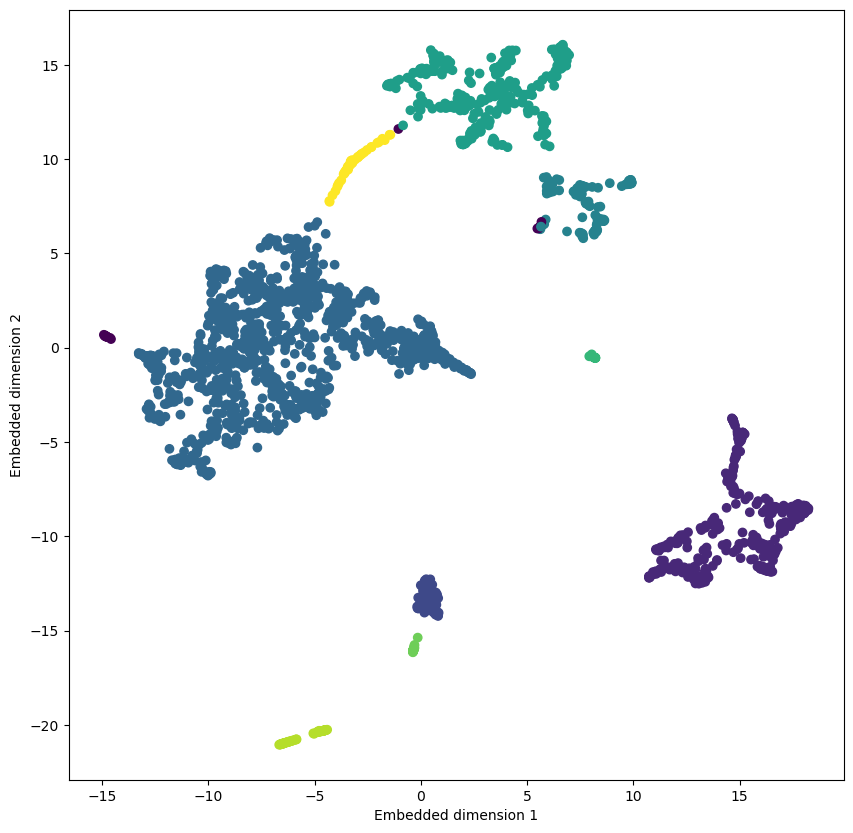

In [188]:
from sklearn.cluster import DBSCAN

cluster = DBSCAN(eps = 1.3,min_samples = 20)#quite sensitive to "eps" parameter
# For a more rigorous approach to parameterization, a "k-nearest distances" plot can be used.
cluster.fit(X_transformed)
labels = cluster.labels_

fig, ax = plt.subplots(figsize = (10,10))
ax.scatter(X_transformed[:,0],X_transformed[:,1],c=labels,label = np.unique(labels))
ax.set_xlabel("Embedded dimension 1")
ax.set_ylabel("Embedded dimension 2")

# Add labels & embedded dimension values to dataframe
iof_data_reduced.loc[:,'embedded dimension 1'] = np.array(X_transformed[:,0])
iof_data_reduced.loc[:,'embedded dimension 2'] = np.array(X_transformed[:,1])
iof_data_reduced.loc[:,'cluster_membership'] = labels

In [189]:
cluster_indices = np.unique(labels)
cluster_sizes = np.zeros(len(cluster_indices))
cluster_fractions = np.zeros(len(cluster_indices))
for i in range(len(cluster_indices)):
    cluster_sizes[i] = np.sum(labels == cluster_indices[i])
    cluster_fractions[i] = np.divide( np.sum(labels == cluster_indices[i]) , len(labels))

print("Number of clusters (excluding noise):",len(cluster_indices)-1)
cluster_percentages = cluster_fractions*100
print("Cluster % of total data:",cluster_percentages)
np.set_printoptions(precision=1, suppress=True)

Number of clusters (excluding noise): 9
Cluster % of total data: [ 1.1 16.5  3.5 49.9  5.7 15.8  1.1  1.2  2.7  2.4]


In [190]:
# Remove small clusters (and noise)
for i in range(len(cluster_indices)):
    if cluster_fractions[i] < 0.03:
    #    retain_observation = np.array([iof_data_reduced['cluster_membership'] != cluster_indices[i]])
       iof_data_reduced = iof_data_reduced[iof_data_reduced['cluster_membership'] != cluster_indices[i]]
       
labels_final = iof_data_reduced['cluster_membership'].to_numpy()

cluster_indices_final = np.unique(labels_final)
cluster_sizes_final,cluster_fractions_final = np.zeros(len(cluster_indices_final)),np.zeros(len(cluster_indices_final))
# cluster_fractions_final = np.zeros(len(cluster_indices_final))
for i in range(len(cluster_indices_final)):
    cluster_sizes_final[i] = np.sum(labels_final == cluster_indices_final[i])
    cluster_fractions_final[i] = np.divide( np.sum(labels_final == cluster_indices_final[i]) , len(labels_final))

print("Final number of clusters:",len(cluster_indices_final))
cluster_percentages_final = cluster_fractions_final*100
print("Cluster % of total data:",cluster_percentages_final)
np.set_printoptions(precision=1, suppress=True)

Final number of clusters: 5
Cluster % of total data: [18.1  3.8 54.6  6.2 17.3]


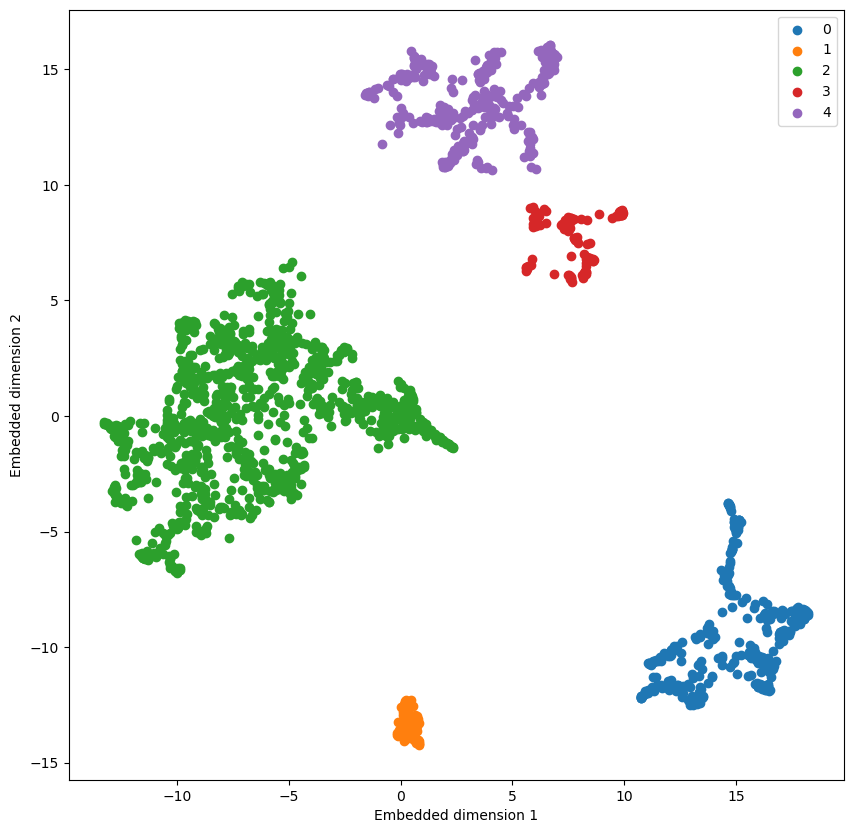

In [ ]:
fig, ax = plt.subplots(figsize = (10,10))
for i in range(len(cluster_indices_final)):
    class_pts = np.array([iof_data_reduced['cluster_membership'] == cluster_indices_final[i]]).reshape(-1)
    ax.scatter(iof_data_reduced.loc[class_pts,"embedded dimension 1"],iof_data_reduced.loc[class_pts,"embedded dimension 2"],label = cluster_indices_final[i])
    ax.set_xlabel("Embedded dimension 1")
    ax.set_ylabel("Embedded dimension 2")
    ax.legend()
#I love the fact that the colour scheme is set to "Henri Matisse" by default! 

In [ ]:
#Should results be desirable, save to csv file.
# iof_data_reduced.to_csv("Clustered_results") #run 06/10/25 

In [210]:
# Train a kernel support vector machine classifier (k-SVC) to identify the classes.
# Train the classifier on the original feature space, not the embedding.
# One of the advantages of this is that we can query the model using SHAP analysis to understand which process variables
# drive the model's classification choices. We can't do this if we train the classifier on the embedding.

# k-SVC's are robust to outliers and capable of handling high-dimensional input spaces adequately. 
# In my experience, they work well for classifying process data.

from sklearn import svm
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV

classify =  svm.SVC()
X_classify = iof_data_reduced[['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level']].to_numpy()

X_classify = StandardScaler().fit_transform(X_classify)
Y_true = iof_data_reduced["cluster_membership"].to_numpy()

param_grid = {'C': [0.1, 1, 10,100], 'kernel': ['rbf'], 'gamma': [0.01, 0.1, 1, 10, 100]}
# C: regularisation parameter. Smaller C --> wider margin --> more misclassificatios but ptoentailly better generalisation
# Larger C --> fewer misclassificatios, but potential overfitting.
# gamma: kernel coefficient. Higher gamma --> closer fit

grid_search = GridSearchCV(classify, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_classify, Y_true)
best_params = grid_search.best_params_
print(best_params)
# classify.fit(X_classify,Y_true)
Y_SVC = grid_search.predict(X_classify)
confusion_matrix(Y_true,Y_SVC)

#This classifier will likely overfit - there are no misclassified points,as indicated by the confusion matrix.

{'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}


array([[ 374,    0,    0,    0,    0],
       [   0,   79,    0,    0,    0],
       [   0,    0, 1127,    0,    4],
       [   0,    0,    0,  129,    0],
       [   0,    0,    4,    0,  355]], dtype=int64)

In [ ]:
# Use SHAP to determine what drives classifier outputs

#NOTE: the classifier actually consists of 4 sub-models - one for each class.
# It appears that these sub-models cannot be accessed here.
# I suspect that only the assigned class (the class with the highest score) is retained.
# Accordingly,the SHAP methods available in this toolbox approximate the relationship between the input features and one overall model,
# as opposed to the relationship between the input features and each sub-model. 

import shap

def f(X): #SHAP requires that the model is embedded within a function.
    return grid_search.predict(X)

# Determine a SHAP approximation model
explainer = shap.KernelExplainer(f,shap.sample(X_classify,100), #these randomly sampled datapoints are used to determine the value of a feature when it is omitted
                                 feature_names = ['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level'])

In [ ]:
#Apply SHAP to 100 observations
shap_values = explainer(shap.sample(X_classify,100))

  0%|          | 0/100 [00:00<?, ?it/s]

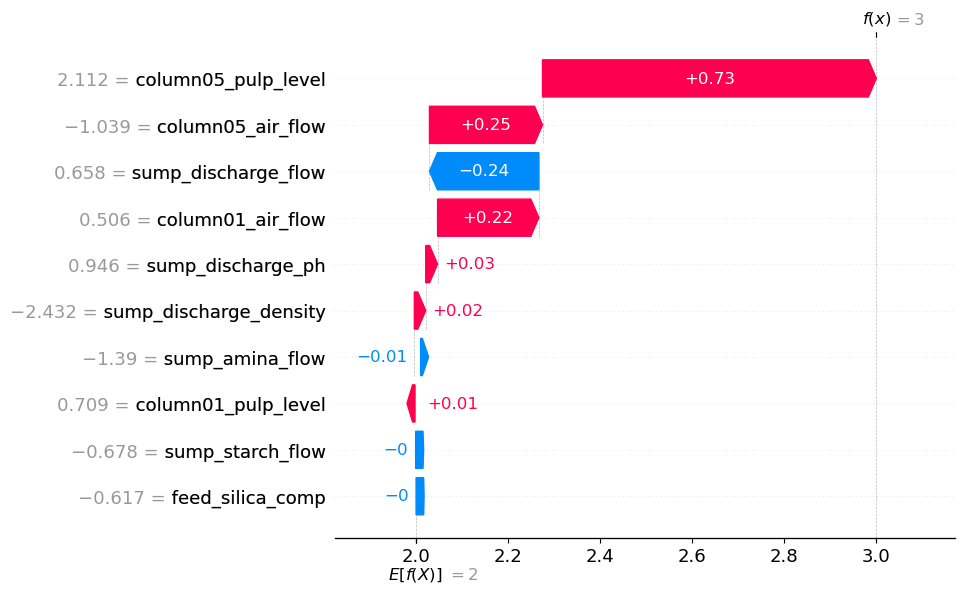

In [289]:
# Waterfall plot for individual prediction
shap.plots.waterfall(shap_values[50])
# This plot shows how each feature contributed to the model output for a single observation.
# Grey values are the input feature values, SHAP values are given in the plot on the right-hand side. 
# Features which yield an increase in the model output are shown in red, while features which
# yield a decrease in model output are shown in blue.

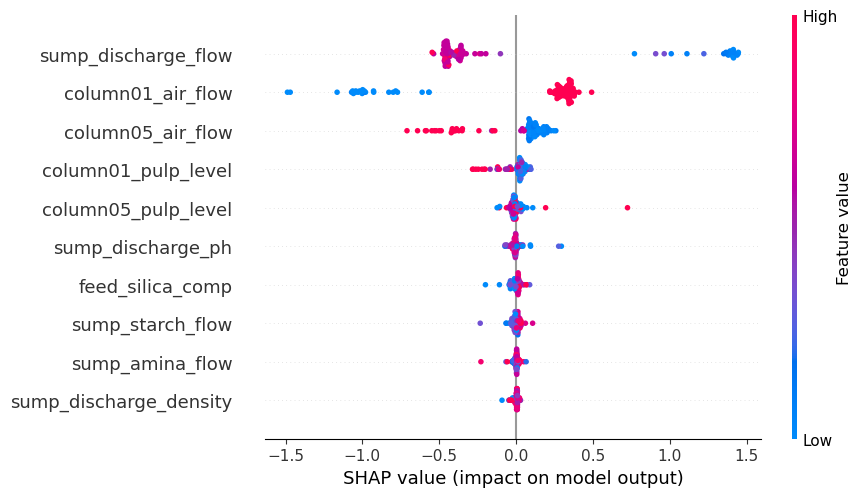

In [ ]:
# Provide SHAP analysis results for the entire dataset via a beeswarm plot
shap.plots.beeswarm(shap_values)
# Beeswarm plots have the advantage that they illustrate they show how the magnitude (low/high) of the input corresponds affects the Shapley values, and thus the model outputs.
# This enables making detailed observations about the relationship between model inputs & outputs.
# This plot, which draws on data from all classes, shows that low discharge flow rates tend to yield high SHAP values, and vice versa.
# Moreover, low column 1 air flow rates lead to low air flow rates, and vice versa. 
# The opposite relationship holds for column 5. 

# Furthermore, feature importance decreases from top to bottom: sump discharge flow rate & air flow rates are evidently the most important features. This is followed by the pulp levels.
# This is reflected in the size of the SHAP values for these features (significant distance from zero). 

In [ ]:
# Apply SHAP analysis to data pertaining only to each individual class.
# This results in multiple SHAP analyses, each of which hold for a given class.

Class_ind = np.zeros([len(iof_data_reduced),len(cluster_indices_final)])
for i in range(len(cluster_indices_final)):
    Class_ind[:,i] = np.array([iof_data_reduced['cluster_membership'] == cluster_indices_final[i]])

# Create a SHAP instance for each class
X_classify_A = X_classify[Class_ind[:,0] == 1]
explainer_A = shap.KernelExplainer(f,shap.sample(X_classify_A,100),feature_names = ['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level'])
shap_values_A = explainer(shap.sample(X_classify_A,50))

X_classify_B = X_classify[Class_ind[:,1] == 1]
explainer_B = shap.KernelExplainer(f,shap.sample(X_classify_B,100),feature_names = ['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level'])
shap_values_B = explainer(shap.sample(X_classify_B,50))

X_classify_C = X_classify[Class_ind[:,2] == 1]
explainer_C = shap.KernelExplainer(f,shap.sample(X_classify_C,100),feature_names = ['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level'])
shap_values_C = explainer(shap.sample(X_classify_C,50))

X_classify_D = X_classify[Class_ind[:,3] == 1]
explainer_D = shap.KernelExplainer(f,shap.sample(X_classify_D,100),feature_names = ['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level'])
shap_values_D = explainer(shap.sample(X_classify_D,50))

X_classify_E = X_classify[Class_ind[:,4] == 1]
explainer_E = shap.KernelExplainer(f,shap.sample(X_classify_E,100),feature_names = ['feed_silica_comp','sump_starch_flow','sump_amina_flow','sump_discharge_flow','sump_discharge_ph','sump_discharge_density',
          'column01_air_flow','column05_air_flow','column01_pulp_level','column05_pulp_level'])
shap_values_E = explainer(shap.sample(X_classify_E,50))

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

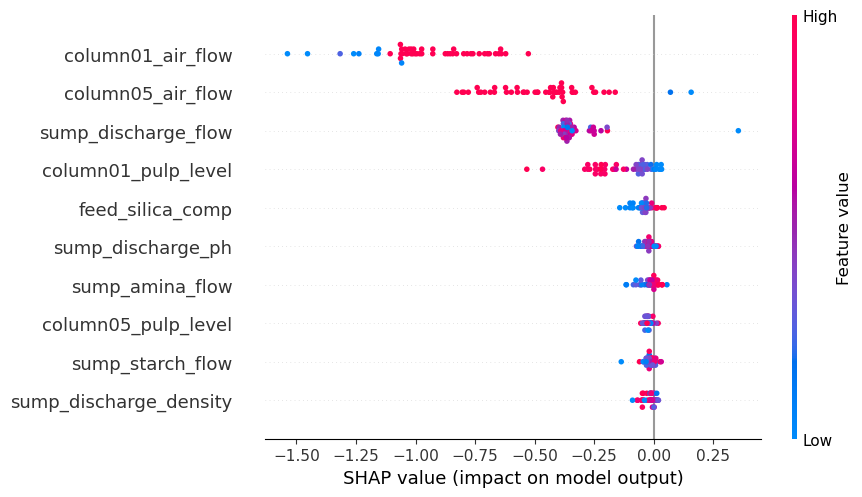

In [ ]:
#Class A (0)
shap.plots.beeswarm(shap_values_A)

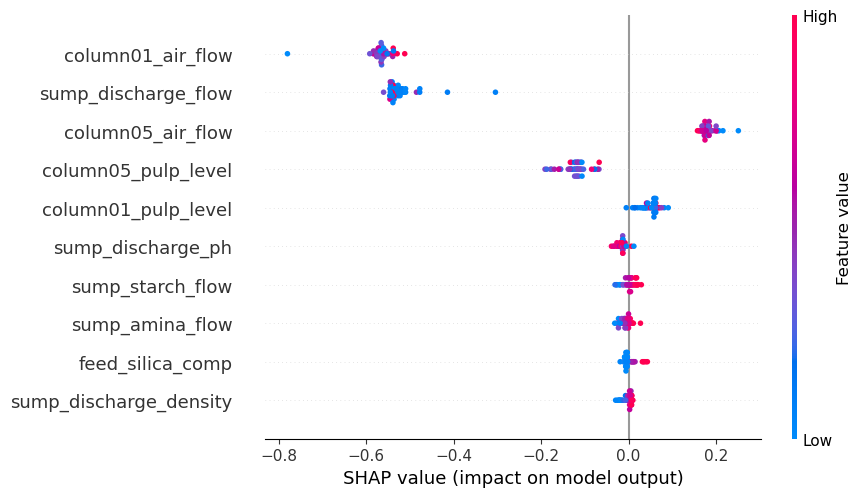

In [ ]:
# Class B (1)
shap.plots.beeswarm(shap_values_B)

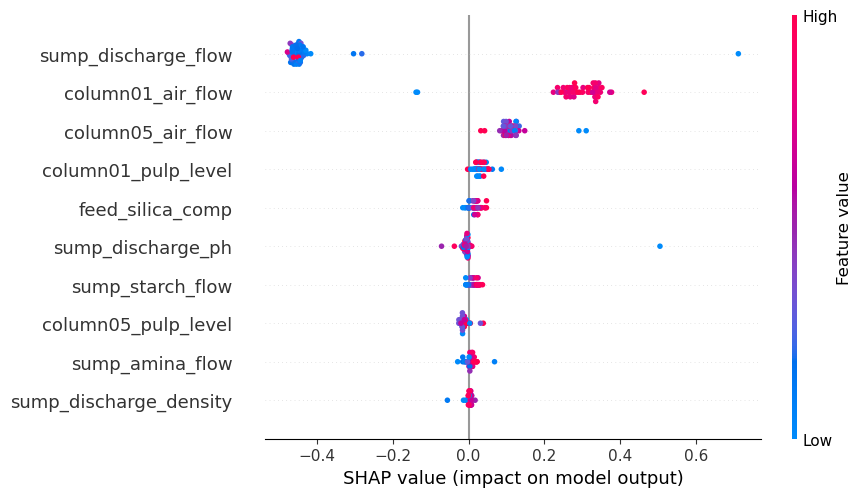

In [ ]:
# Class C (2)
shap.plots.beeswarm(shap_values_C)

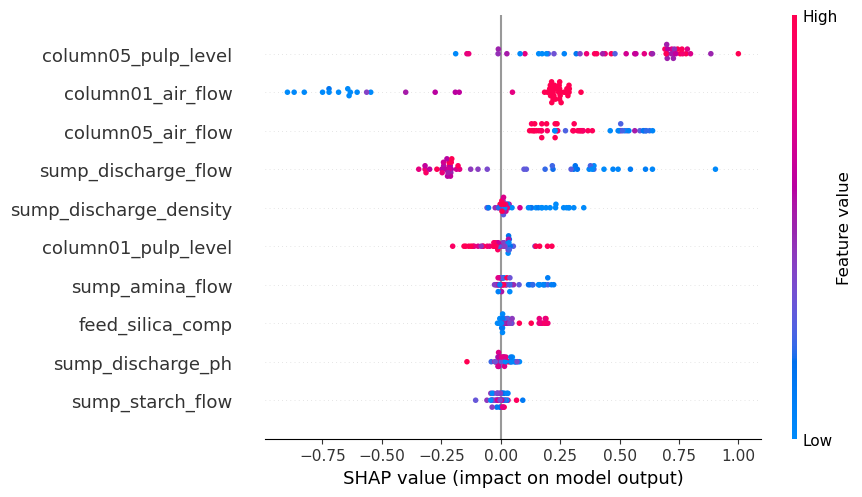

In [ ]:
# Class D (3)
shap.plots.beeswarm(shap_values_D)

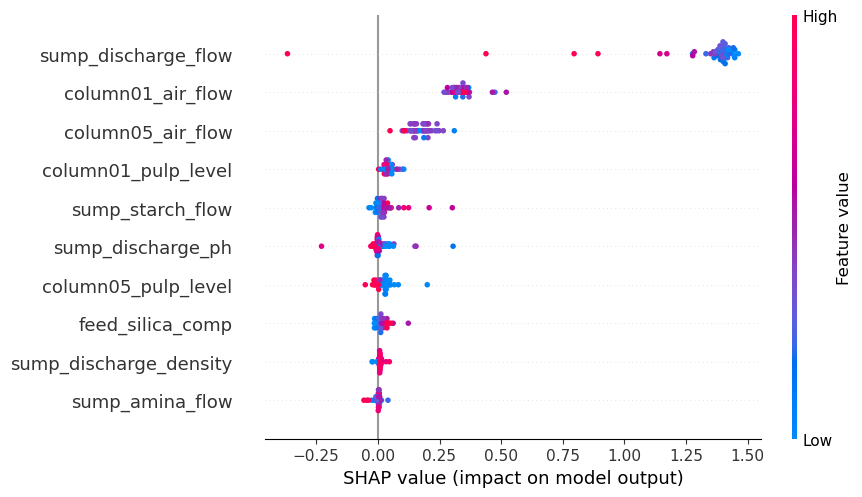

In [ ]:
#Class E (4)
shap.plots.beeswarm(shap_values_E)

The above swarm charts show that sump discharge flow, air flow & pulp level are among the most important features in determining classifier outputs for each class (i.e. process mode). 
This mirrors the SHAP analysis results performed for the total dataset (i.e., with data drawn from all classes). Evidently, these features drive class (process mode) membership.